In [1]:
#Library loading
library(monocle3)
library(Seurat)
library(SeuratWrappers)
library(ggplot2)
library(dplyr)
library(patchwork)
library(magrittr)

#http://htmlpreview.github.io/?https://github.com/satijalab/seurat-wrappers/blob/master/docs/monocle3.html 참조
#https://satijalab.org/signac/articles/monocle.html


Loading required package: Biobase

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, setdiff, sort, table, tapply,
    union, unique, unsplit, which.max, which.min


Welcome to Bioconductor

    Vignettes contain introductory material; view with


In [7]:
#Plot size 조정
options(repr.plot.width = 8, repr.plot.height = 8, repr.plot.res = 600)

In [21]:
# Load the data from seurat rds
Epi.integrated <- readRDS('/home/minho2/Epi2_integrated.rds')

In [30]:
# Transfer seurat cluster info
list_cluster <-  Epi.integrated@meta.data[['seurat_clusters']]
names(list_cluster) <-  Epi.integrated@assays[["RNA"]]@data@Dimnames[[2]]
list_cluster

AAACCCAAGCAACCAG-1_1 AAACCCAAGGACTGGT-1_1 AAACCCACATCGCTGG-1_1 
                   0                    0                    0 
AAACCCAGTAGCGAGT-1_1 AAACCCAGTATGGGAC-1_1 AAACCCAGTCGTGGTC-1_1 
                   0                    1                    4 
AAACCCATCGTTCAGA-1_1 AAACCCATCTGGGAGA-1_1 AAACGAAAGAGAGGTA-1_1 
                   0                    5                    4 
AAACGAAAGCCAGACA-1_1 AAACGAAAGGTGCAGT-1_1 AAACGAAAGTAAGACT-1_1 
                   0                    0                    2 
AAACGAACAAAGCTCT-1_1 AAACGAACAAGGACAC-1_1 AAACGAACACTCATAG-1_1 
                   1                    4                    0 
AAACGAACAGCTCTGG-1_1 AAACGAACATTGAGGG-1_1 AAACGAAGTCTGTGAT-1_1 
                   1                    0                    3 
AAACGAAGTTGTACGT-1_1 AAACGAAGTTTGGCTA-1_1 AAACGAATCGACATAC-1_1 
                   4                    0                    4 
AAACGCTAGGGAGATA-1_1 AAACGCTCAACCGATT-1_1 AAACGCTCAAGCGAAC-1_1 
                   0                    2                    2 
AAACGCTCAGCAGTAG-1_1 AAACGCTCATCCGTGG-1_1 AAACGCTCATGGGCAA-1_1 
                   1                    2                    0 
AAACGCTGTGGCTTGC-1_1 AAACGCTTCAGCCTTC-1_1 AAAGAACAGAGTCACG-1_1 
                   2                    0                    3 
AAAGAACCATCGAGCC-1_1 AAAGAACCATGGGTCC-1_1 AAAGAACCATTGAAAG-1_1 
                   2                    1                    4 
AAAGAACGTAATCAAG-1_1 AAAGAACGTACTGAGG-1_1 AAAGAACGTGGTCTGC-1_1 
                   5                    0                    1 
AAAGAACTCCACAAGT-1_1 AAAGAACTCCACACCT-1_1 AAAGAACTCGGCTATA-1_1 
                   1                    7                    5 
AAAGAACTCTCCGAAA-1_1 AAAGAACTCTGACGCG-1_1 AAAGGATAGGCGCTCT-1_1 
                   1                    5                    5 
AAAGGATAGGGTATAT-1_1 AAAGGATAGTCCTGCG-1_1 AAAGGATCAGAGTTGG-1_1 
                   1                    0                    1 
AAAGGATCAGCGTGAA-1_1 AAAGGATCATCTCCCA-1_1 AAAGGATGTCTCGACG-1_1 
                   5                    4                    2 
AAAGGATGTGCTCTTC-1_1 AAAGGATTCGTTATCT-1_1 AAAGGGCCAATCTGCA-1_1 
                   4                    3                    2 
AAAGGGCCACGTATAC-1_1 AAAGGGCCATCCGGTG-1_1 AAAGGGCCATCTCCCA-1_1 
                   0                    3                    0 
AAAGGGCGTAACAAGT-1_1 AAAGGGCGTAGGCAAC-1_1 AAAGGGCGTGATTCAC-1_1 
                   4                    0                    4 
AAAGGGCGTGCTAGCC-1_1 AAAGGGCGTGTCGCTG-1_1 AAAGGGCTCCCAGGCA-1_1 
                   4                    4                    1 
AAAGGTAAGAATTGCA-1_1 AAAGGTAAGGTAGTAT-1_1 AAAGGTAAGTCCGCGT-1_1 
                   0                    5                    0 
AAAGGTACACATGTTG-1_1 AAAGGTACAGCAATTC-1_1 AAAGGTAGTACGATGG-1_1 
                   2                    2                    0 
AAAGGTAGTCTAATCG-1_1 AAAGGTAGTGTCTTGA-1_1 AAAGGTATCACTACGA-1_1 
                   0                    2                    0 
AAAGGTATCTGGGTCG-1_1 AAAGTCCAGATACAGT-1_1 AAAGTCCAGCGGCTCT-1_1 
                   5                    1                    7 
AAAGTCCCAGCTCTGG-1_1 AAAGTCCCATGGAATA-1_1 AAAGTCCGTAGACAGC-1_1 
                   4                    2                    1 
AAAGTCCGTCGCACGT-1_1 AAAGTCCGTCTGATCA-1_1 AAAGTCCGTGTCTTGA-1_1 
                   0                    3                    5 
AAAGTCCTCAGCCTTC-1_1 AAAGTCCTCGACGCTG-1_1 AAAGTGAAGAGCAAGA-1_1 
                   0                    0                    2 
AAAGTGAAGGGCTTCC-1_1 AAAGTGACAGGTTCCG-1_1 AAAGTGAGTTGCCATA-1_1 
                   4                    0                    1 
AAAGTGAGTTGCTCGG-1_1 AAAGTGATCGAACGGA-1_1 AAATGGAAGACGCCCT-1_1 
                   1                    8                    2 
AAATGGAAGAGCATCG-1_1 AAATGGACAAGTCATC-1_1 AAATGGACACCCTCTA-1_1 
                   0                    4                    4 
AAATGGACAGAGCTAG-1_1 AAATGGACAGCAAGAC-1_1 AAATGGAGTCAGTTTG-1_1 
                   3                    2                    2 
AAATGGATCTACCCAC-1_1 AACAAAGAGCT

In [43]:
# Transfer seurat cluster info
cds <- as.cell_data_set(Epi.integrated)
cds <- cluster_cells(cds = cds, reduction_method = "UMAP")

cds@clusters@listData[["UMAP"]][["clusters"]] <- list_cluster
cds@clusters@listData[["UMAP"]][["louvain_res"]] <- "NA"

Warning message:
“Monocle 3 trajectories require cluster partitions, which Seurat does not calculate. Please run 'cluster_cells' on your cell_data_set object”


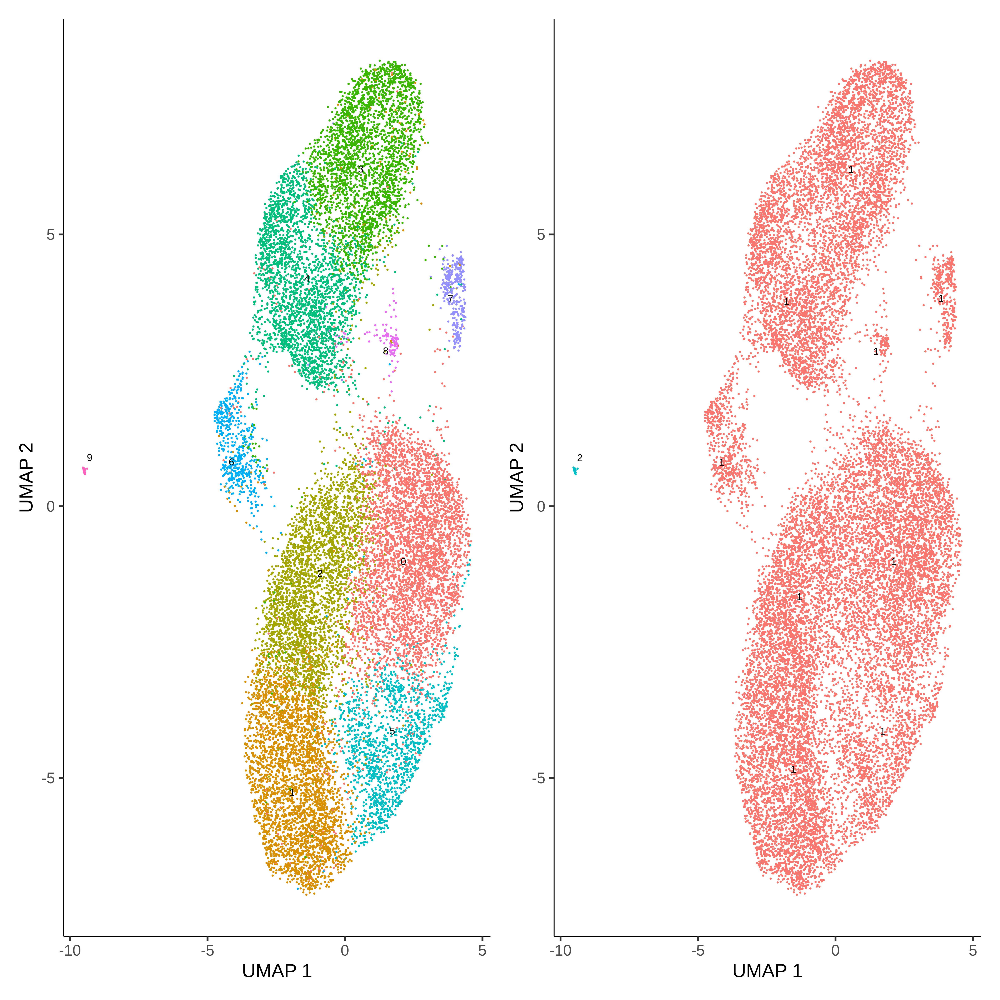

In [44]:
# Dimplot
p1 <- plot_cells(cds, show_trajectory_graph = FALSE)
p2 <- plot_cells(cds, color_cells_by = "partition", show_trajectory_graph = FALSE)
wrap_plots(p1, p2)

In [45]:
# Building trajectories with Monocle 3 it will take a long times
cds <- learn_graph(cds, use_partition = TRUE)

  |======================================================================| 100%


Warning message in min(data_df$weight[data_df$weight > 0]):
“no non-missing arguments to min; returning Inf”


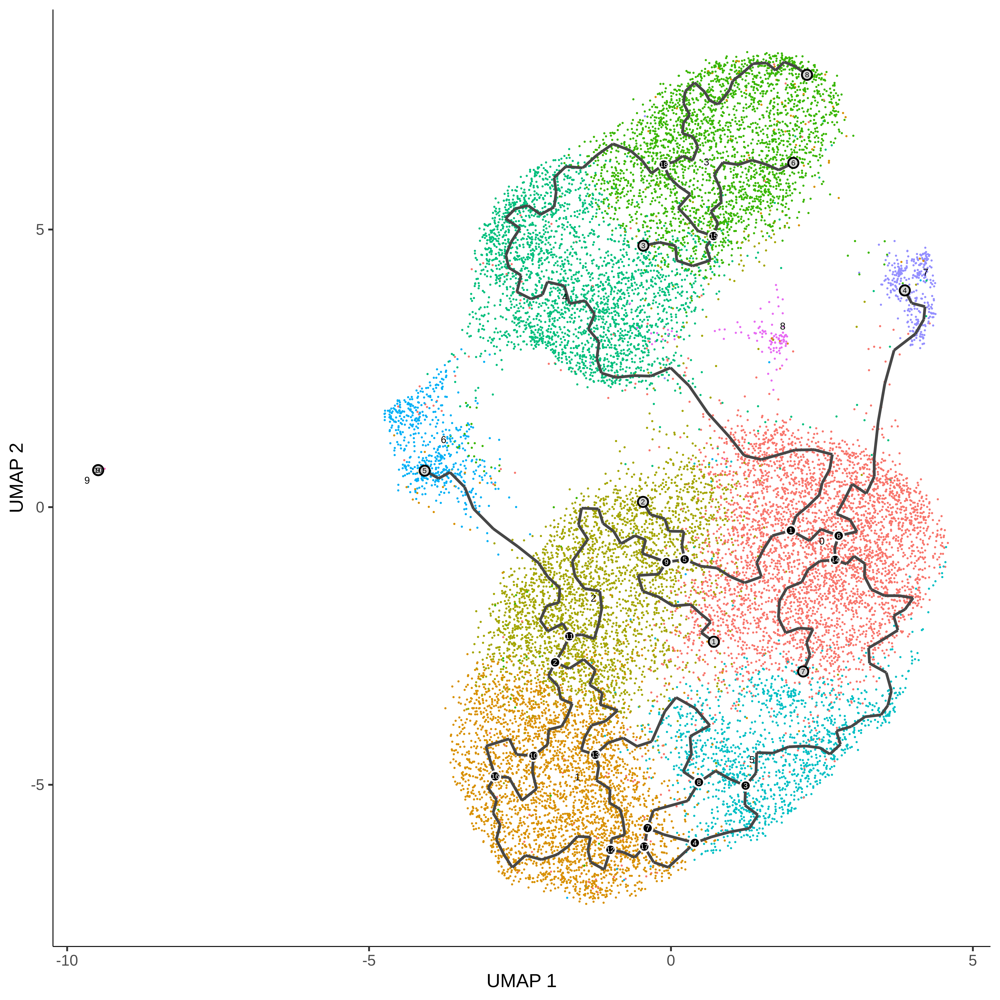

In [48]:
# dimplot with monocle3 trajectory
plot_cells(cds, 
           label_groups_by_cluster = TRUE, 
           label_leaves = TRUE, 
           label_branch_points = TRUE,
           graph_label_size=1.5)

Cells aren't colored in a way that allows them to be grouped.



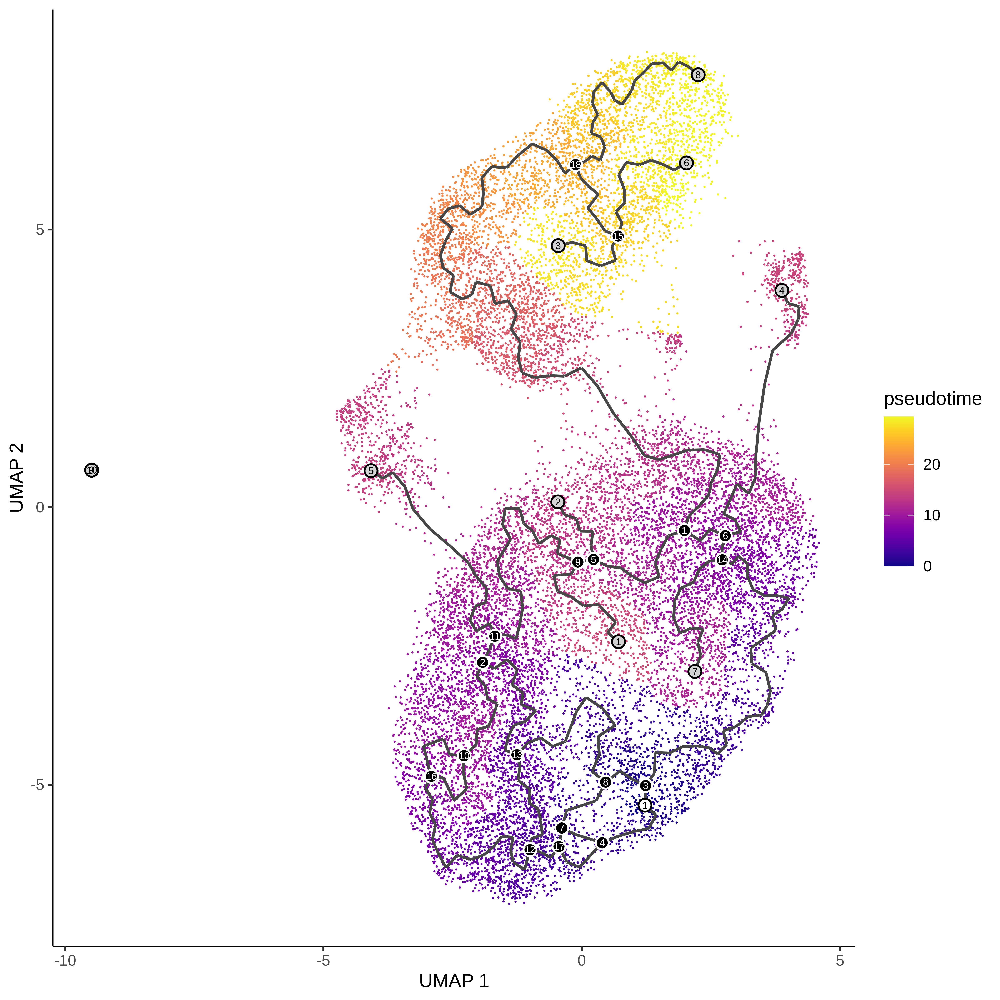

In [52]:
# Select starting point with gene name
max.avp <- which.max(unlist(FetchData(Epi.integrated, "Gzma")))
max.avp <- colnames(Epi.integrated)[max.avp]
cds <- order_cells(cds, root_cells = max.avp)
plot_cells(cds, color_cells_by = "pseudotime", 
           label_cell_groups = TRUE, 
           label_leaves = TRUE, 
           label_branch_points = TRUE)

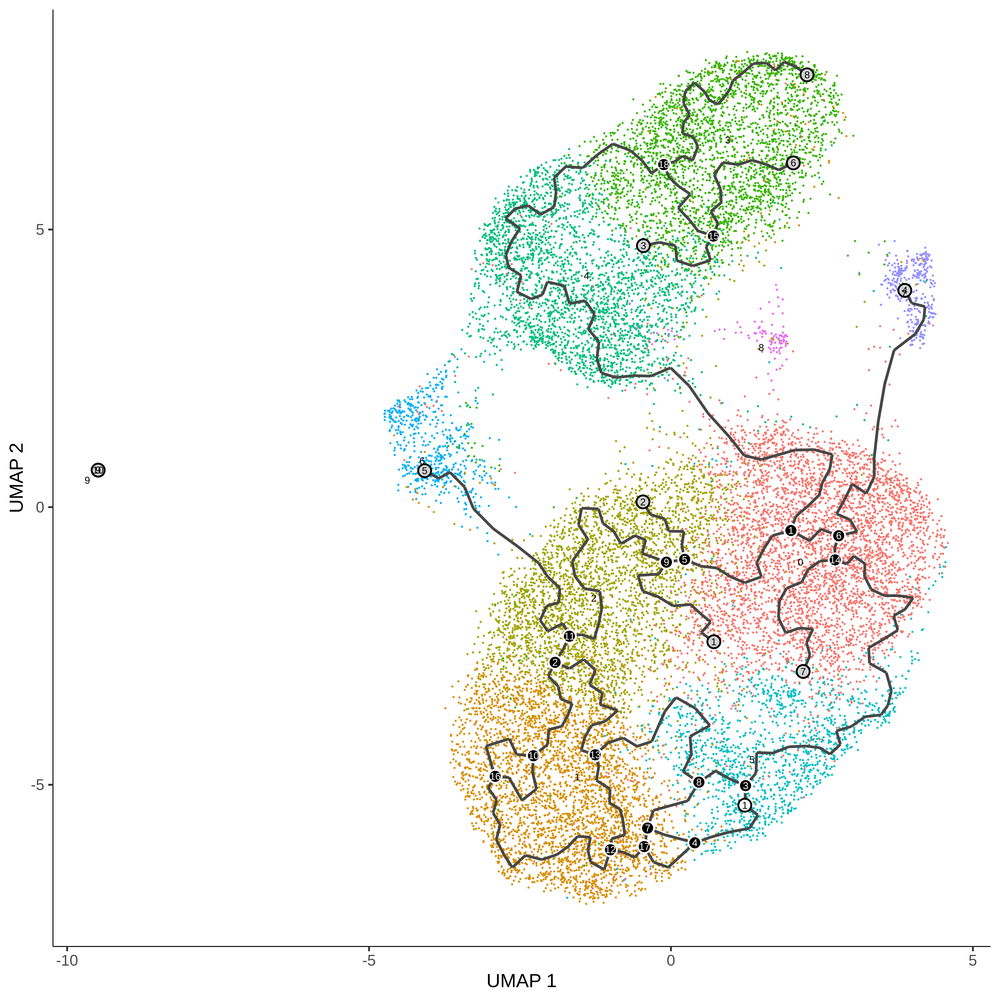

In [61]:
plot_cells(cds, reduction_method= "UMAP")

In [59]:
cds

class: cell_data_set 
dim: 2000 19339 
metadata(1): citations
assays(2): logcounts counts
rownames(2000): Spp1 Hspb1 ... Tgm1 Cgnl1
rowData names(0):
colnames(19339): AAACCCAAGCAACCAG-1_1 AAACCCAAGGACTGGT-1_1 ...
  TTTGTTGTCTCTCTAA-1_2 TTTGTTGTCTTTGGAG-1_2
colData names(8): orig.ident nCount_RNA ... seurat_clusters ident
reducedDimNames(2): PCA UMAP
altExpNames(0):